In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

In [ ]:
!pip install pyyaml==5.1

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from google.colab.patches import cv2_imshow

In [3]:
register_coco_instances("my_dataset_train", {}, "drive/MyDrive/fire/train/train.json", "drive/MyDrive/fire/train")
register_coco_instances("my_dataset_val", {}, "drive/MyDrive/fire/val/val.json", "drive/MyDrive/fire/val")
register_coco_instances("my_dataset_test", {}, "drive/MyDrive/fire/test/test.json", "drive/MyDrive/fire/test")

WARNING [12/20 00:52:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/20 00:52:29 d2.data.datasets.coco]: Loaded 358 images in COCO format from drive/MyDrive/fire/train/train.json


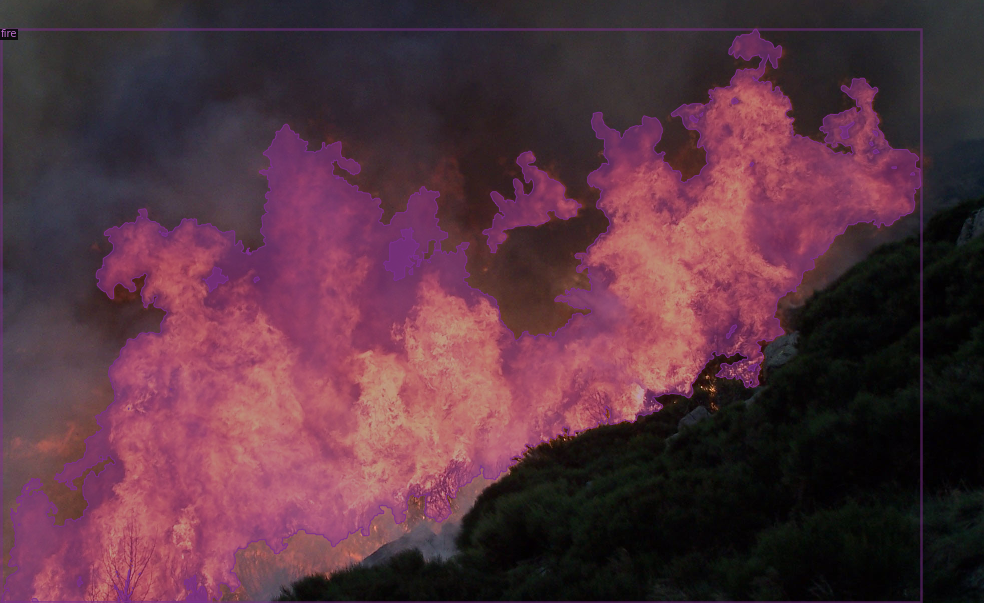

drive/MyDrive/fire/train/152_rgb.png


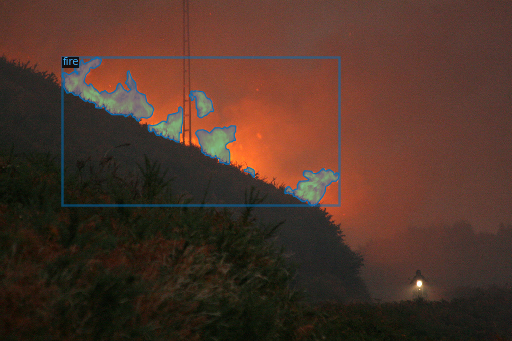

drive/MyDrive/fire/train/140_rgb.png


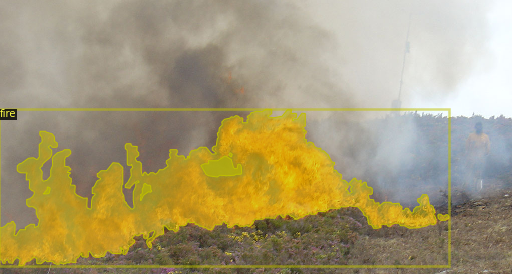

drive/MyDrive/fire/train/075_rgb.png


In [4]:
#REMOVED 14, 16, 24, 59, 60, 77, 117, 121, 138, 142, 151, 175, 181, 183, 193, 200, 217, 219, 226, 237, 248, 249, 250, 252, 253, 264, 312, 313, 315, 344, 348, 352, 355, 357, 358, 369, 371, 382, 387, 391, 392, 397
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    print(d["file_name"])

In [ ]:
my_dataset_val_metadata = MetadataCatalog.get("my_dataset_val")
dataset_dicts_val = DatasetCatalog.get("my_dataset_val")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts_val, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_val_metadata, scale=0.3)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    print(d["file_name"])

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1500
cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.TEST.EVAL_PERIOD = 500
cfg.OUTPUT_DIR = "drive/MyDrive/fire/OutputBB"

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
class CocoTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok = True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume = True)
trainer.train()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

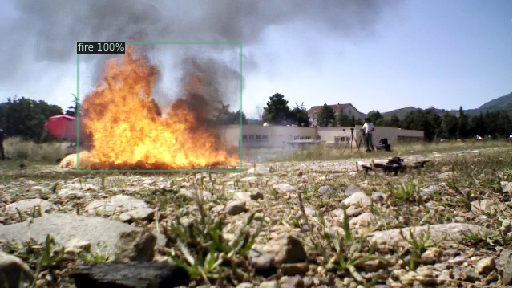

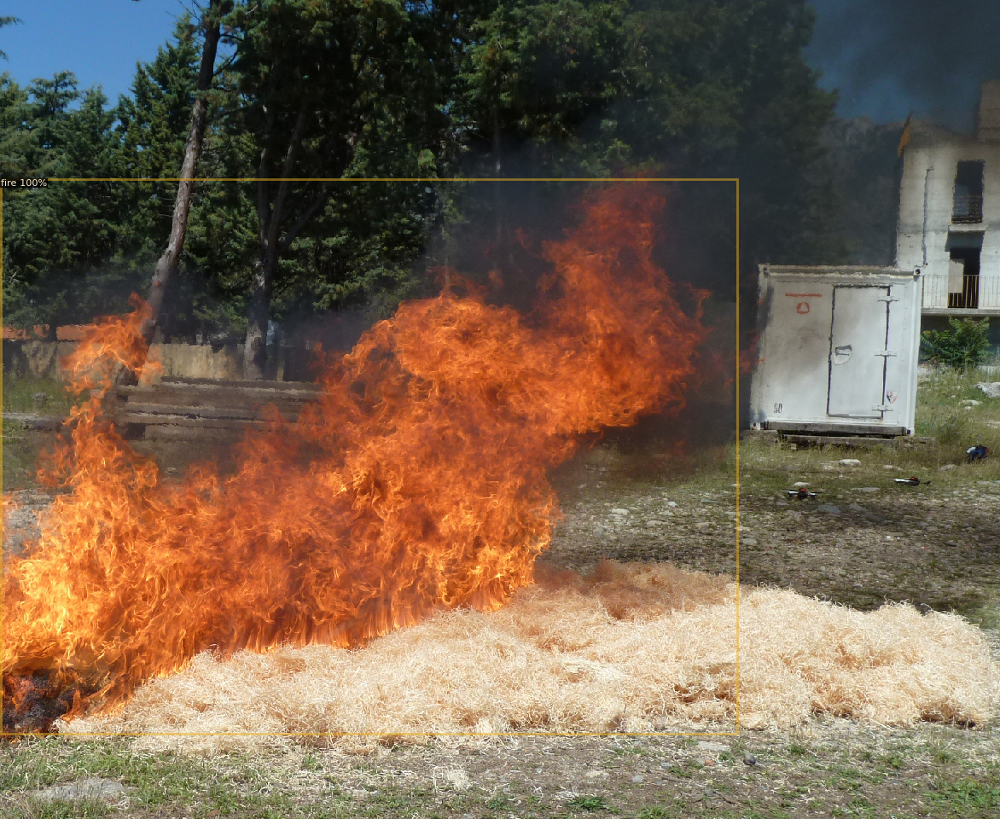

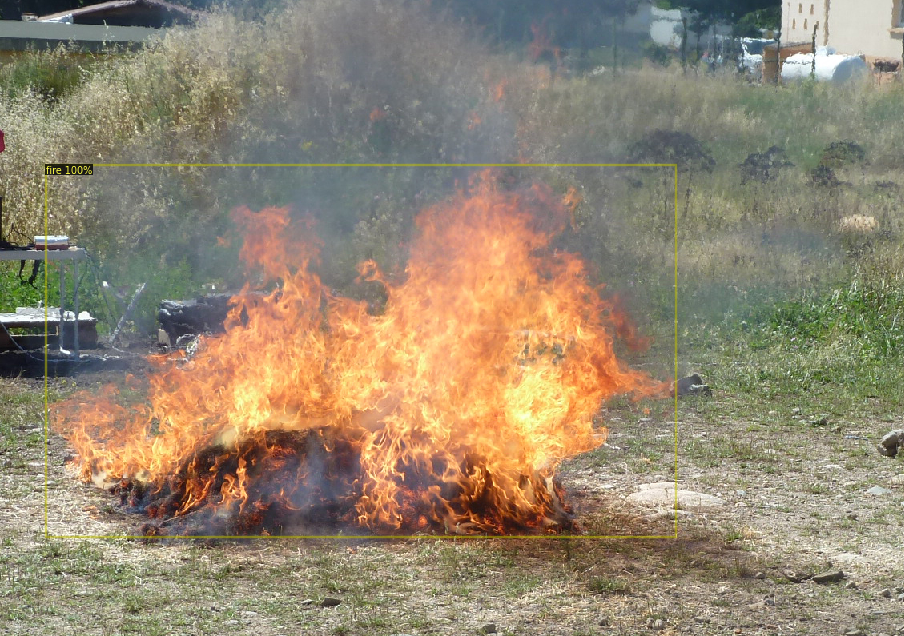

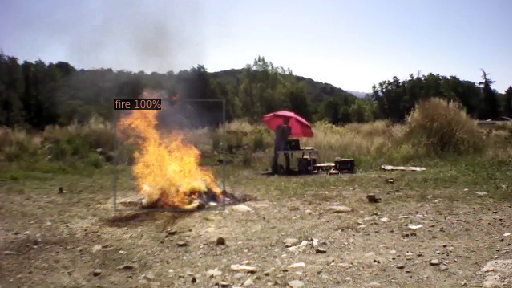

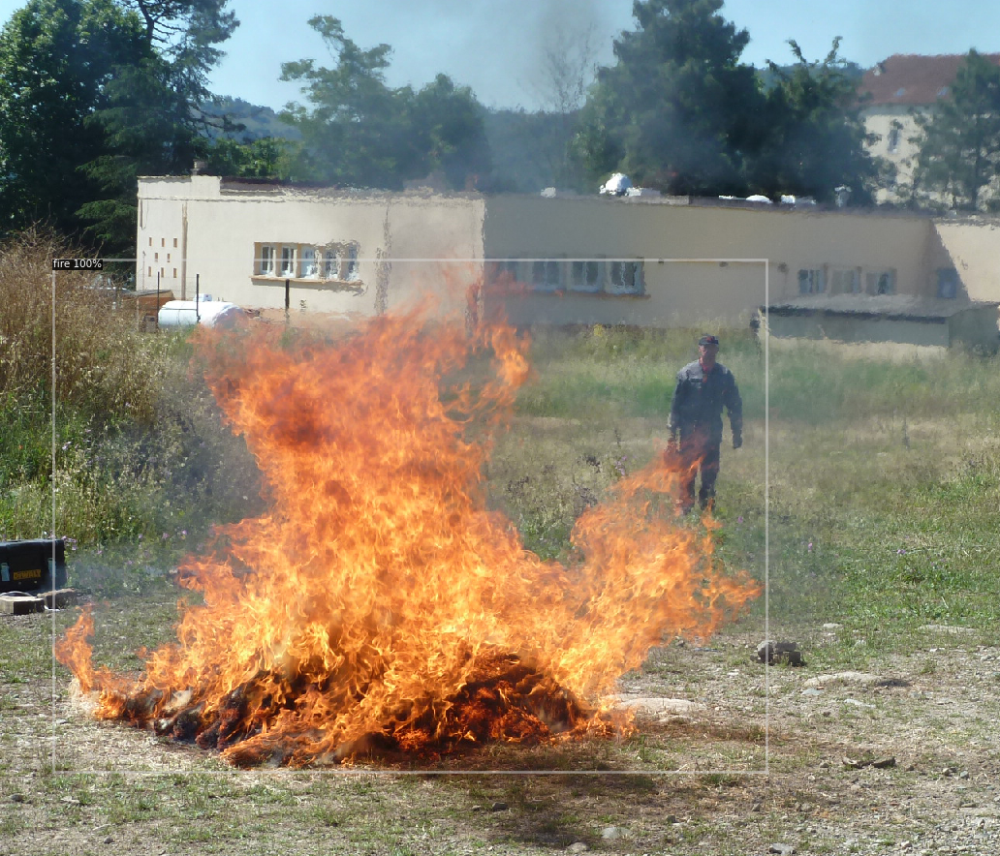

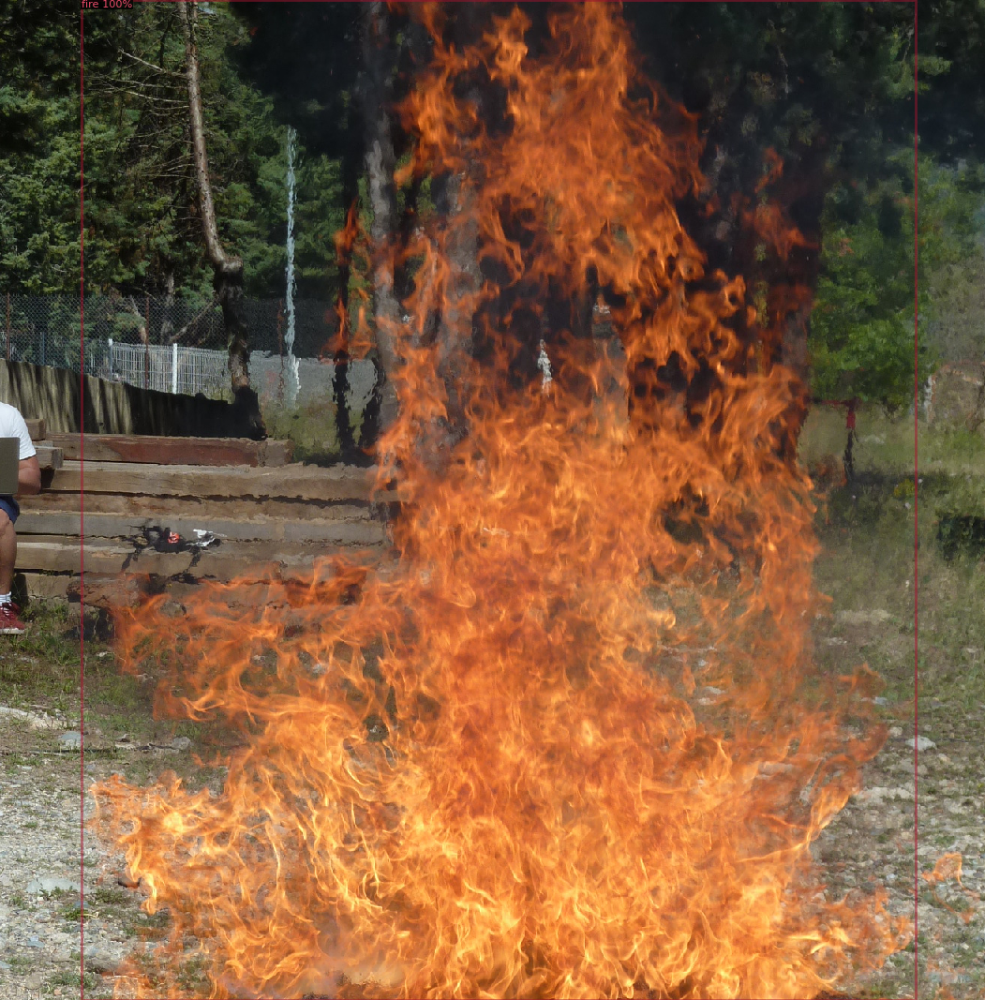

In [9]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_val", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_val")
from detectron2.utils.visualizer import ColorMode
count = 0
import glob
for imageName in glob.glob('drive/MyDrive/fire/val/*rgb.png'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8,
                instance_mode=ColorMode.IMAGE_BW 
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  count = count + 1
  if count > 5:
    break

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", ("bbox", "segm"), False)
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

In [ ]:
#!ffmpeg -r 30 -f image2 -s 1920x1080 -i drive/MyDrive/fire/segmented/frame_%04d.jpg -vcodec libx264 -crf 25  -pix_fmt yuv420p test.mp4
!git clone https://github.com/facebookresearch/detectron2
!pip install youtube-dl
!pip uninstall -y opencv-python-headless opencv-contrib-python
!apt install python3-opencv

In [14]:
with open("drive/MyDrive/fire/OutputBB/Config.yaml", 'w') as f:
  f.write(cfg.dump()) 

In [ ]:
!python detectron2/demo/demo.py --config-file /content/drive/MyDrive/fire/OutputBB/Config.yaml --video-input /content/drive/MyDrive/fire/vid2.mp4 --confidence-threshold 0.7 --output /content/drive/MyDrive/fire/video-bouding1.mkv \
  --opts MODEL.WEIGHTS /content/drive/MyDrive/fire/OutputBB/model_final.pth

In [ ]:
!python detectron2/demo/demo.py --config-file /content/drive/MyDrive/fire/OutputInsV2/Config.yaml  --video-input /content/drive/MyDrive/fire/vid2.mp4 --confidence-threshold 0.7 --output /content/drive/MyDrive/fire/video-mask.mkv \
  --opts MODEL.WEIGHTS /content/drive/MyDrive/fire/OutputInsV2/model_final.pth